In [1]:
model_type = 'vgg16'
model_tag = 'base'
model_id = '{:s}_{:s}'.format(model_type, model_tag)
model_dir = './saved_model/model_{:s}.h5'.format(model_id)
freeze_backbone = True # True => transfer learning; False => train from scratch

In [2]:
import pandas as pd
import os
import json
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
from pathlib import Path
from models import FacePrediction
import glob
from PIL import Image
from tqdm import tqdm_notebook as tqdm

2023-06-03 11:17:31.750930: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
import csv

In [4]:
model = FacePrediction(img_dir = './data/face_aligned/', model_type = model_type)
model.define_model(freeze_backbone = freeze_backbone)
model.model.summary()

model.load_weights(model_dir)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 224, 224, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 224, 224, 64  36928       ['conv1_1[0][0]']                
                                )                                                           

 sex_bn2 (BatchNormalization)   (None, 128)          512         ['sex_fc2[0][0]']                
                                                                                                  
 bmi_act2 (Activation)          (None, 128)          0           ['bmi_bn2[0][0]']                
                                                                                                  
 age_act2 (Activation)          (None, 128)          0           ['age_bn2[0][0]']                
                                                                                                  
 sex_act2 (Activation)          (None, 128)          0           ['sex_bn2[0][0]']                
                                                                                                  
 dropout_1 (Dropout)            (None, 128)          0           ['bmi_act2[0][0]']               
                                                                                                  
 dropout_3

In [5]:
filename = "./csv/filename_bmi.csv"

In [6]:
#check if csv file exists or not
#delete if exists
f = open(filename, "w+")
f.close()

.DS_Store
Skipping image: ./bmi_test/.DS_Store (corrupt or unsupported format)
Cleave_2021_Summer.png
1/1 [==============================] - 0s 429ms/step
BMI  17.58158
['Cleave_2021_Summer', 17.58158]
Darshan_2022_Spring.png
1/1 [==============================] - 0s 22ms/step


libpng warning: iCCP: known incorrect sRGB profile


1/1 [==============================] - 0s 126ms/step
BMI  16.316362
['Darshan_2022_Spring', 16.316362]
Darshan_2018_Spring.png
1/1 [==============================] - 0s 131ms/step
BMI  20.317636
['Darshan_2018_Spring', 20.317636]
Darshan_2022_Summer.png
1/1 [==============================] - 0s 131ms/step
BMI  22.238792
['Darshan_2022_Summer', 22.238792]
Cleave_2021_Spring.png
Skipping image: ./bmi_test/Cleave_2021_Spring.png (corrupt or unsupported format)
Darshan_2018_Summer.png
1/1 [==============================] - 0s 132ms/step
BMI  18.570896
['Darshan_2018_Summer', 18.570896]
Darshan_2017_Spring.png
1/1 [==============================] - 0s 123ms/step
BMI  18.253664
['Darshan_2017_Spring', 18.253664]
Darshan_2019_Spring.png
1/1 [==============================] - 0s 126ms/step
BMI  21.135527
['Darshan_2019_Spring', 21.135527]
Darshan_2016_Summer.png
1/1 [==============================] - 0s 45ms/step


libpng warning: iCCP: known incorrect sRGB profile


1/1 [==============================] - 0s 128ms/step
BMI  20.199976
['Darshan_2016_Summer', 20.199976]
Darshan_2021_Spring.png
1/1 [==============================] - 0s 135ms/step
BMI  17.425947
['Darshan_2021_Spring', 17.425947]
Darshan_2016_Spring.png
1/1 [==============================] - 0s 130ms/step
BMI  18.46953
['Darshan_2016_Spring', 18.46953]
Darshan_2016_Summer_2.png
1/1 [==============================] - 0s 42ms/step


libpng warning: iCCP: known incorrect sRGB profile


1/1 [==============================] - 0s 121ms/step
BMI  18.127964
['Darshan_2016_Summer_2', 18.127964]


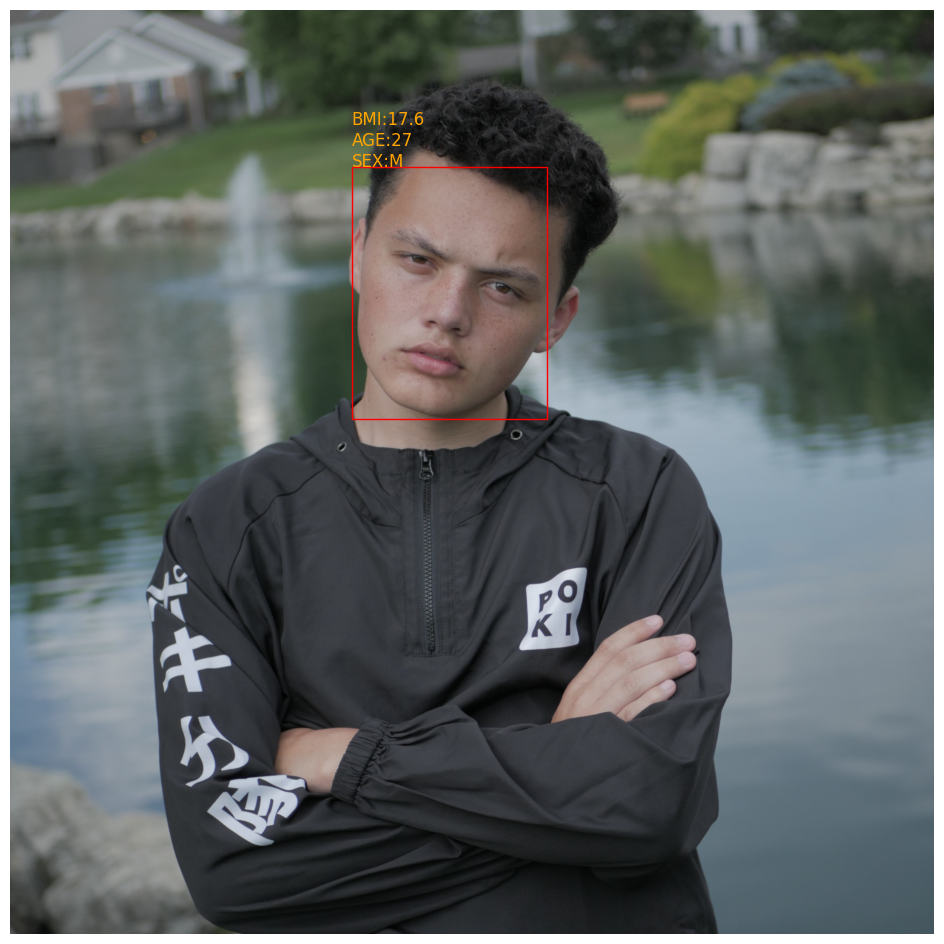

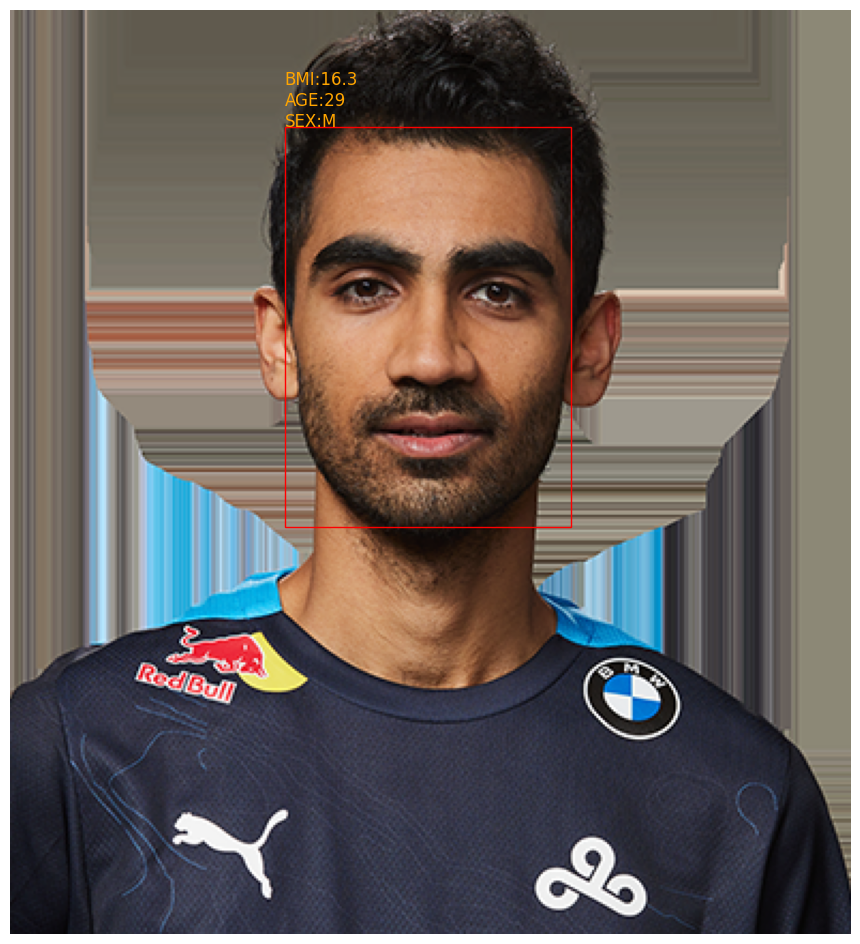

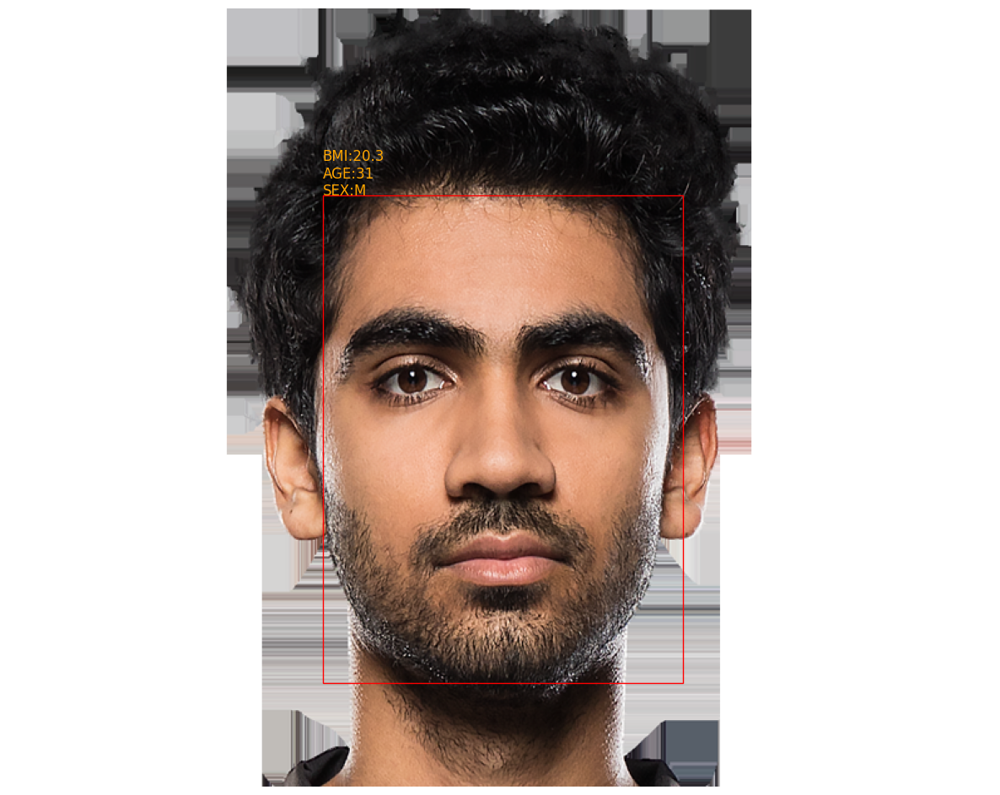

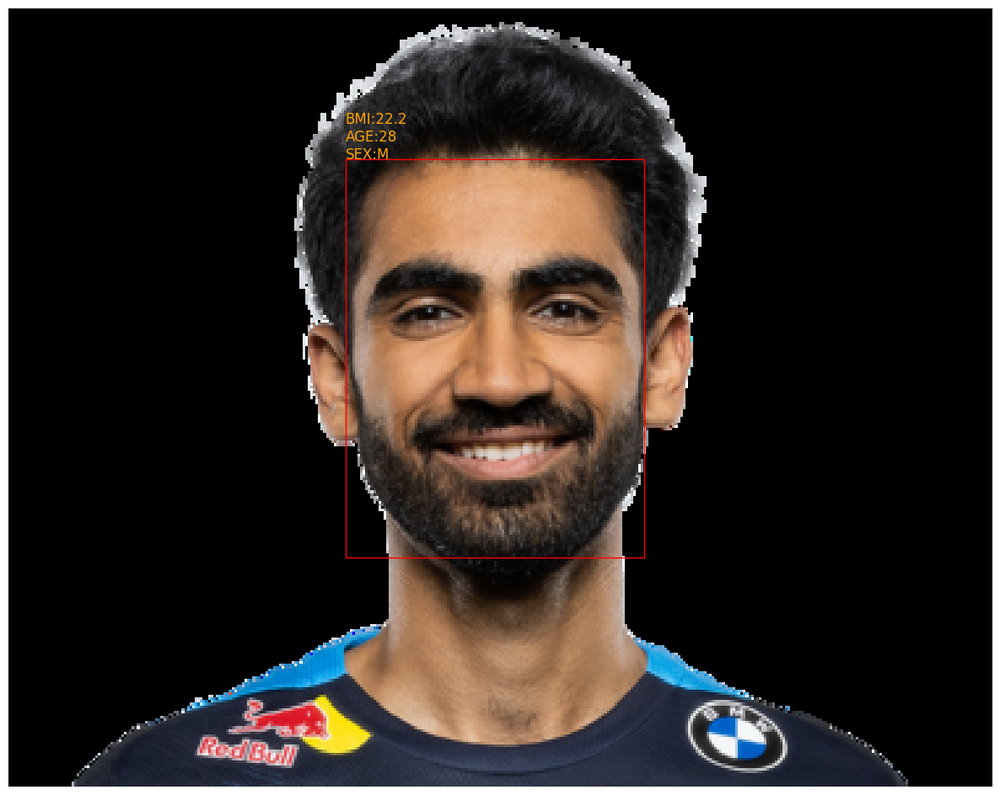

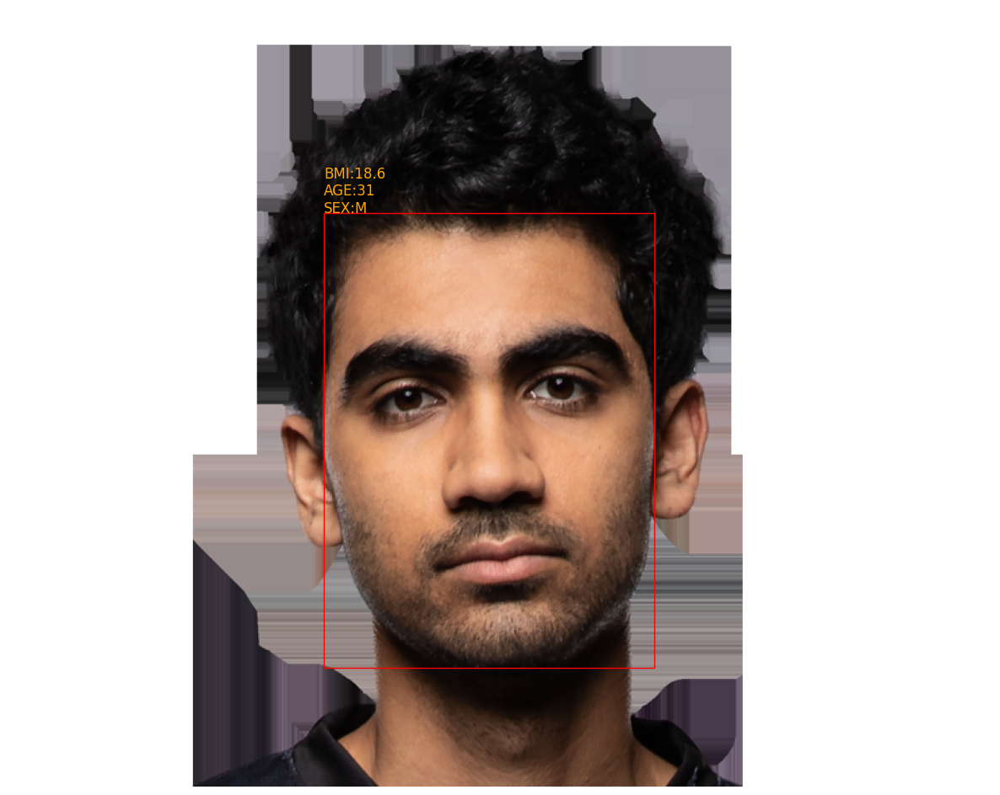

...

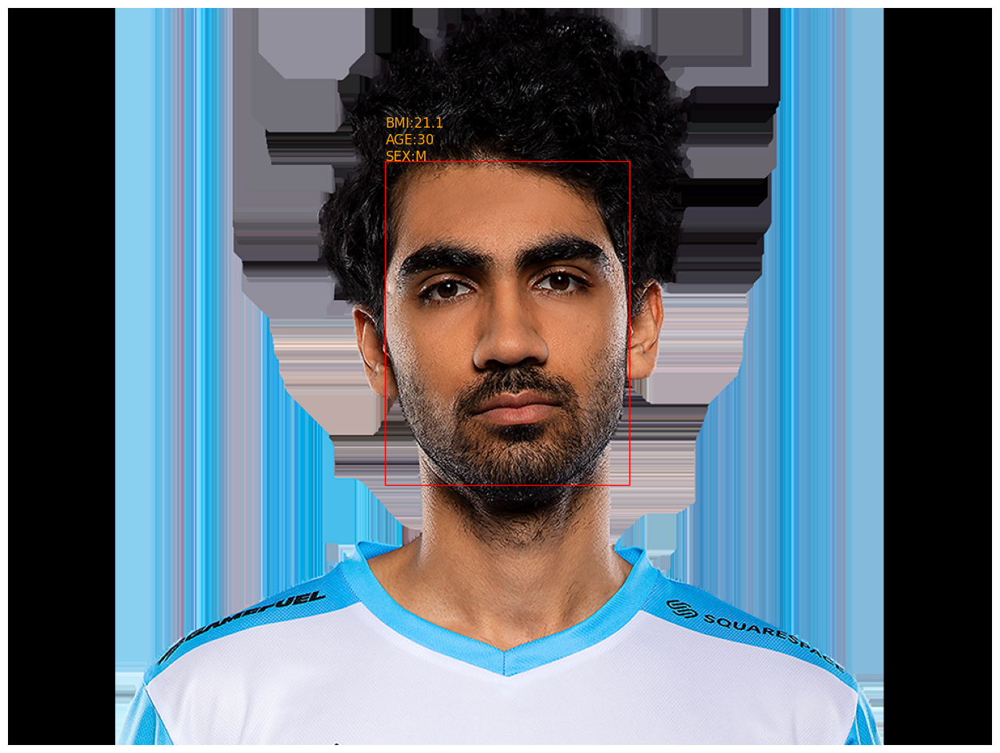

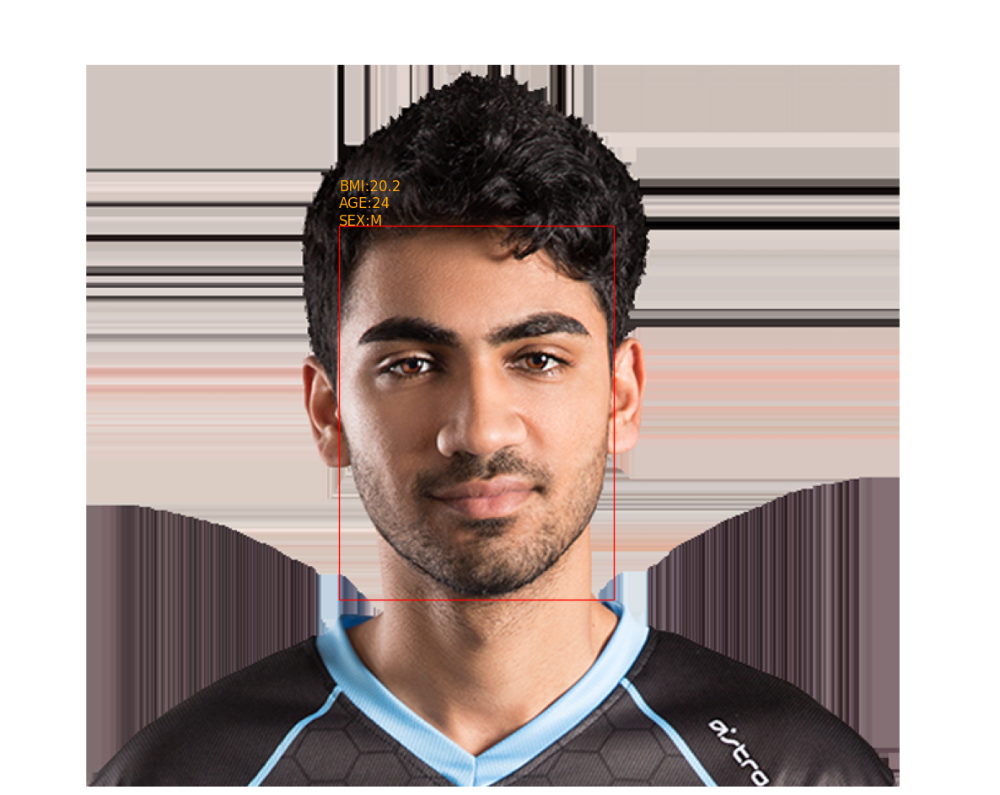

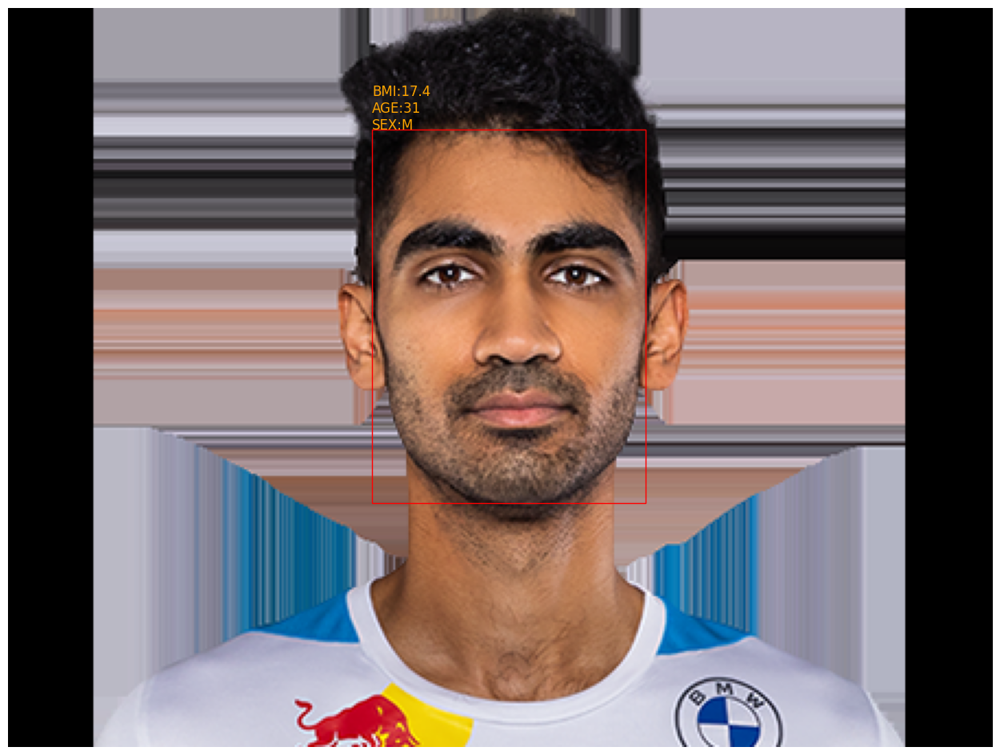

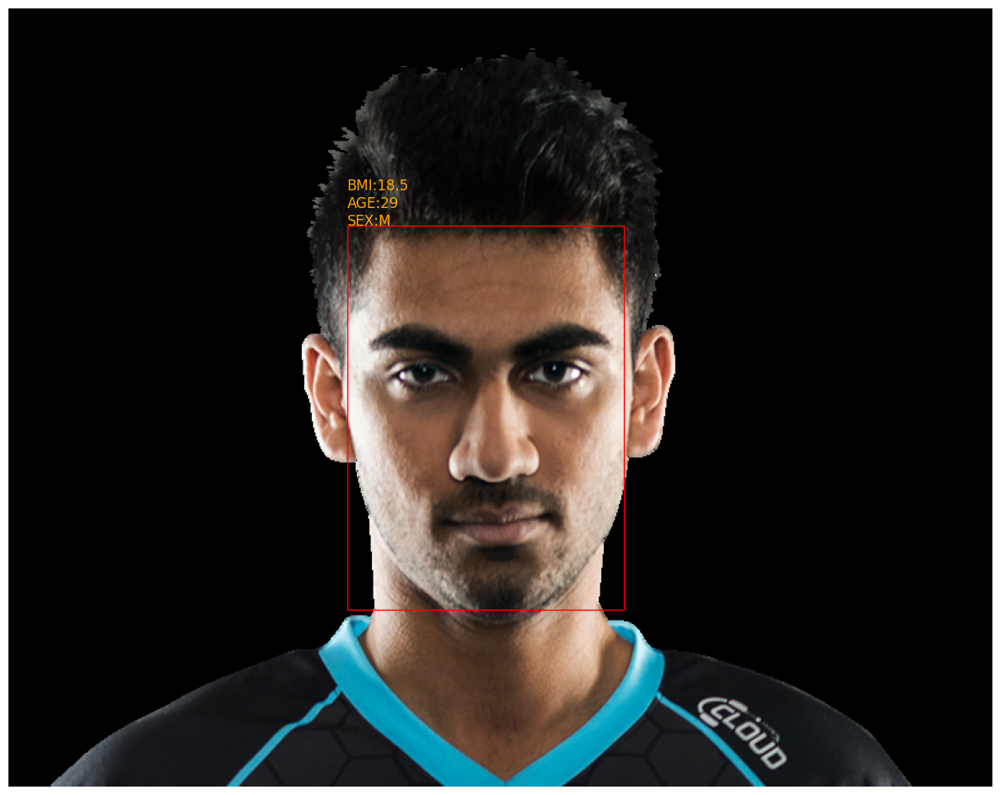

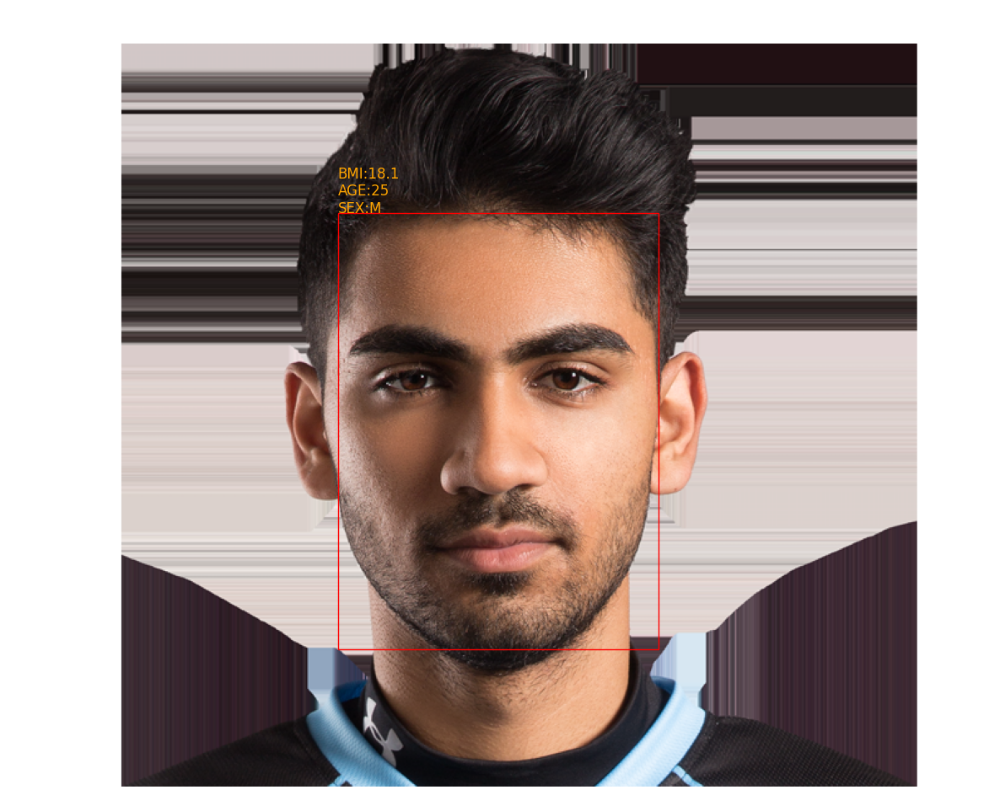

In [7]:
directory = './bmi_test/'
with open(filename, "w", newline="") as f:
    writer = csv.writer(f)
    for item in os.listdir(directory):
        print(item)
        data_arr = []
        data_arr.append(item[:-4]) # we dont want .png
        item_path = os.path.join(directory, item)
        try:
            image = Image.open(item_path)
            pred = model.predict_faces(item_path, color='orange')
            data_arr.append(pred[0][0][0][0])
            print(data_arr)
            writer.writerows([data_arr])
        except Image.UnidentifiedImageError:
            print(f"Skipping image: {item_path} (corrupt or unsupported format)")
            continue

1/1 [==============================] - 0s 133ms/step
BMI  17.58158
17.58158


UsageError: Line magic function `%%capture` not found.


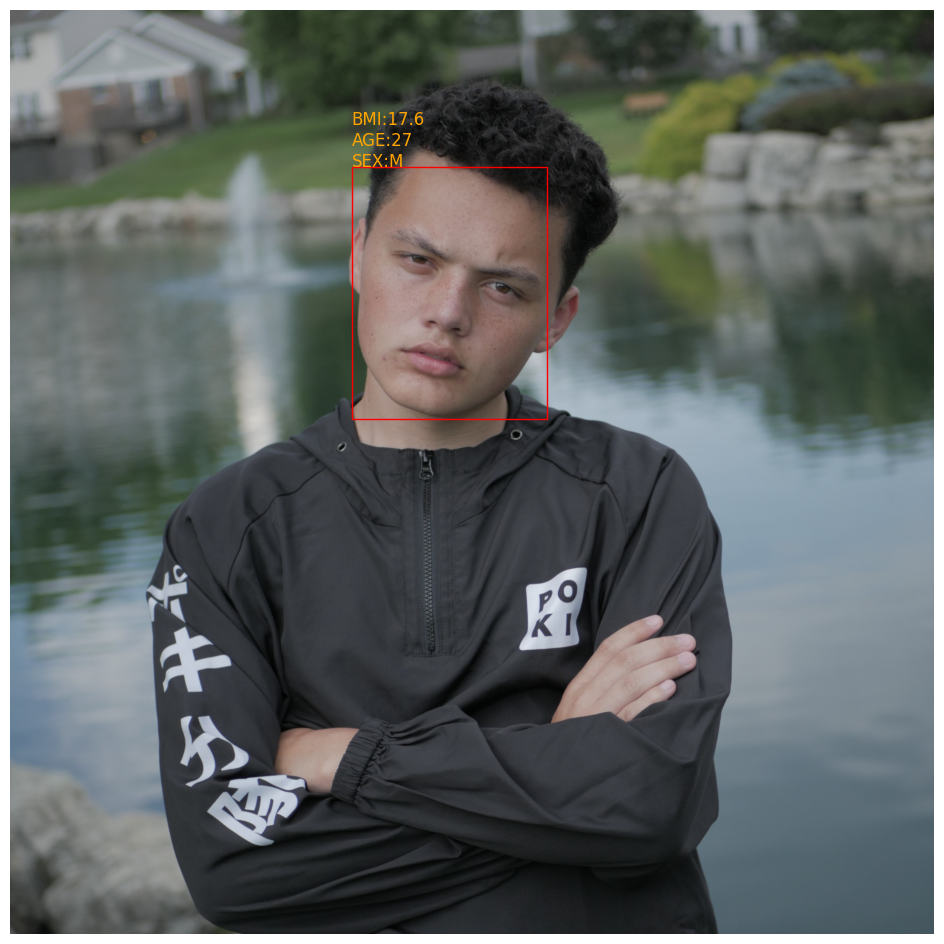

In [10]:
preds = model.predict_faces("./bmi_test/Cleave_2021_Summer.png", color='orange')
print(preds[0][0][0][0])
%%capture 

In [9]:
stri = "hello_world.png"
print(stri[:-4])

hello_world
